<a href="https://colab.research.google.com/github/Ikeda33/codespaces-railstutorial/blob/main/se_50epoch_flower_D_v_G_sa_FID_KID_devide_1_color_relativistic1_hinge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#パッケージのダウンロード


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import argparse

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim

In [5]:
import torchvision.transforms as transforms

In [6]:
import torchvision.datasets as dset

In [7]:
import torchvision.utils as vutils

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import tqdm

In [9]:
import glob

In [10]:
from torch.utils.data import Dataset
from PIL import Image

In [11]:
from torch.utils.data import DataLoader
import torchvision

In [12]:
!pip install torchmetrics
!pip install torchmetrics[image]

!pip install torch-fidelity

from torchmetrics.image.inception import InceptionScore


import torchmetrics
import torch_fidelity

import torch
_ = torch.manual_seed(123)
from torchmetrics.image.fid import FrechetInceptionDistance
fid = FrechetInceptionDistance(feature=2048)

from torchmetrics.image.kid import KernelInceptionDistance


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 9.5 MB/s eta 0:00:00


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 381MB/s]


In [13]:
kid = KernelInceptionDistance(subset_size=15)

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028


In [14]:
#ハイパーパラメータの設定

In [15]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epoch", type = int, default=50)
parser.add_argument("--batch_size", type = int, default=32)
parser.add_argument("--lr_g", type = float, default=2e-4)
parser.add_argument("--lr_d", type = float, default=3e-4)
parser.add_argument("--nch_g", type = int, default=64)
parser.add_argument("--nch_d", type = int, default=64)
parser.add_argument("--z_dim", type = int, default=100)
parser.add_argument("--beta1", type = float, default=0.5)

opt = parser.parse_args(args=[])
print(opt)

Namespace(n_epoch=50, batch_size=32, lr_g=0.0002, lr_d=0.0003, nch_g=64, nch_d=64, z_dim=100, beta1=0.5)


In [16]:
class ImageDataset(Dataset):
    def __init__(self,  transform = None):
        super().__init__()
        self.file_list = glob.glob("/content/drive/MyDrive/102flowers (2)/jpg/*.jpg")#/content/drive/MyDrive/img_align_celeba.zip
        #self.file_list = glob.glob("/content/drive/MyDrive/cityscapes/cityscapes_data/train/*.jpg" )#/content/drive/MyDrive/cityscapes/cityscapes_data/train
        #self.file_list = glob.glob("/content/drive/MyDrive/Test/**/*.jpg" )#fruits
       # self.file_list = glob.glob("/content/drive/MyDrive/img_align_celeba.zip/jpg/*.jpg")#C:\Users\ikeda\Downloads\img_align_celeba\img_align_celeba
        #self.file_list = glob.glob("/content/drive/MyDrive/–¢Šm”F 758452(1).crdownload/*.jpg")
        self.transform = transform


    def __getitem__(self, index):
        if self.transform is not None:
            img = self.transform(Image.open(self.file_list[index]))
        else:
            img = Image.open(self.file_list[index])
        return img

    def __len__(self):
        return len(self.file_list)

In [17]:
from torchvision.transforms.transforms import CenterCrop

transform = transforms.Compose([

    transforms.Resize(80),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
                               transforms.Normalize((0.5,),(0.5,))])

In [18]:
#dataset = dset.MNIST("./", train = True, download = True,transform = transform)
dataset = ImageDataset(transform = transform)
#dataset = torchvision.datasets.CelebA("./", split = "test", download = True,transform = transform) #Cityscapes
#dataset = torchvision.datasets.Cityscapes("C:\Users\ikeda\Downloads\cityscapes\cityscapes_data\cityscapes_data", split='train', mode='fine', target_type='color')


In [19]:
dataloader = DataLoader(dataset = dataset, batch_size = opt.batch_size,num_workers = 2,  shuffle = True)

In [20]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [21]:
#モデルの設定

In [22]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [23]:
class ResidualBlock_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE_G(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [24]:
class ResidualBlock_1(nn.Module):#実質パディングとスペクトラム正規化とインスタンス正規化
  def __init__(self, in_channels):
    super().__init__()
    self.conv_layers = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),
        nn.ReLU(inplace = True),

        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),

    )
  def forward(self, x):
    out = self.conv_layers(x)
    out = out + x
    return out

In [25]:
class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        #out_channels = in_channels // n_divide
        out_channels = 1

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [26]:
#import torch
#from layers.transformer.ScaledDotProductAttention import ScaledDotProductAttention
#from torch import nn


class MultiHeadAttention(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.Conv2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)

        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out


In [27]:

class MultiHeadAttention_G(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE_G(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        qkv = self.relu(qkv)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)
        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out

In [28]:
class SelfAttention_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        out_channels = in_channels // n_divide
      #  out_channels = 1

        self.fx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.gx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [29]:
class PF(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) -x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x= self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [30]:
"""    def __init__(self, in_channels):
        super().__init__()
        n_divide = 8
        out_channels = in_channels // n_divide
        self.dim = 3

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool= nn.AvgPool2d(kernel_size =self.dim , stride = 1, padding = 0, count_include_pad=False)
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        B, C, H, W = x.size()
        z = self.pre_bn(x)
        z = self.pool(z, self.dim = H)

        z = self.conv1(z)
        z = self.relu(z)

        z = self.conv2(z)
        z = self.sigmoid(z)

        z = torch.einsum("bchw,bchw->bchw",(x, z))
        out = x + self.gamma * z
        return out
"""

'    def __init__(self, in_channels):\n        super().__init__()\n        n_divide = 8\n        out_channels = in_channels // n_divide\n        self.dim = 3\n\n        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm\n        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#\n        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#\n        self.gamma = nn.Parameter(torch.zeros(1))\n        self.softmax = nn.Softmax(dim = -2)#規格化するため -2\n        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1\n        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))\n        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること\n        self.pre_bn = nn.BatchNorm2d(in_channels)\n        self.bn = n

In [31]:
class SE(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
           # nn.Linear(channel, channel// reduction , bias=False),
            (nn.Conv2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            (nn.Conv2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        #y = self.avg_pool(x).view(b, c)
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)




In [32]:
class SE_G(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            #nn.Linear(channel, channel// reduction , bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [33]:
#nn.ConvTranspose2d
class PF_G(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) - x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x = self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [34]:
"""(((W - K + 2P)/S) + 1)
    Here W = Input size
    K = Filter size
    S = Stride
    P = Padding
    ((Input_size-kernel_size + 2*Padding)/stride)+ 1
    この式を使用できます[(W−K+2P)/S]+1。

W は入力ボリュームです - あなたの場合は 128
Kはカーネルサイズです - あなたの場合は5です
P はパディングです - あなたの場合は 0 だと思います
S はストライドです - あなたが提供していません。
したがって、次の式に入力します。
for example
Output_Shape = (128-5+0)/1+1

Output_Shape = (124,124,40)
output==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W
    """



'(((W - K + 2P)/S) + 1)\n    Here W = Input size\n    K = Filter size\n    S = Stride\n    P = Padding\n    ((Input_size-kernel_size + 2*Padding)/stride)+ 1\n    この式を使用できます[(W−K+2P)/S]+1。\n\nW は入力ボリュームです - あなたの場合は 128\nKはカーネルサイズです - あなたの場合は5です\nP はパディングです - あなたの場合は 0 だと思います\nS はストライドです - あなたが提供していません。\nしたがって、次の式に入力します。\nfor example\nOutput_Shape = (128-5+0)/1+1\n\nOutput_Shape = (124,124,40)\noutput==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W\n    '

In [35]:
class VIT(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size = 3, stride = 1, padding = 3//2)
        self.attention = SelfAttention(in_channels)
        self.se_block_0 = SE(in_channels)
        self.se_block_1 = SE(out_channels)

        self.flat = nn.Flatten()

        self.linear_1 = nn.Linear(32,64, bias=False)
        self.linear_2 = nn.Linear( 32,32, bias=False)#if ( 64,32, bias=False)  -> mat1 and mat2 shapes cannot be multiplied (131072x32 and 64x32)


    def shortcut(self, x):
        x = self.conv3(x)

        x = self.bn(x)
        return x

    def forward(self, x):

        identity = x#入力
        x = self.pre_bn(x)
        x = self.se_block_0(x)
       # x = self.attention(x) - x
        #x = x + identity


      #  identity = x#入力
        x = self.pre_bn(x)
       # b, c, h, w = x.size()
        x = self.conv1(x)


      #  x = self.linear_1(x).view(b, -1, h, w)
        x = self.relu(x)
       # x = self.linear_2(x).view(b, -1, h, w)


      #  x =  self.shortcut(identity) + x

        x = self.bn(x)

        return x

In [36]:
#nn.ConvTranspose2d
class VIT_G(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size=1 -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.attention = MultiHeadAttention_G(in_channels)

    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.attention(x) - x
        x = x + identity

        #identity = x#入力
        x = self.pre_bn(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [37]:
class Generator(nn.Module):
    def __init__(self,pf, vit, resnet,res_net,sa,z_dim = opt.z_dim, ngf = opt.nch_g, nc = 3):# ものくろだからnc=1 カラーならnc=3
        super().__init__()

        self.convt1 = self.conv_trans_layers(z_dim, 8*ngf, 4,1,0 )# ngf = the number of channels

        self.convt2 = self.conv_trans_layers(8*ngf, 4*ngf, 4, 2, 1 )
        self.convt3 = self.conv_trans_layers(4*ngf,  2*ngf, 4,2,1)
        self.convt4 = self.conv_trans_layers(2*ngf,  ngf, 4,2,1 )

        self.pf1 = pf(z_dim, 8*ngf)
        self.vit1 = vit(z_dim, 8*ngf)

        self.pf2 = pf(8*ngf, 4*ngf)
        self.vit2 = vit(8*ngf, 4*ngf)

        self.pf3 = pf(4*ngf,  2*ngf)
        self.vit3 = vit(4*ngf,  2*ngf)

        self.pf4 = pf(2*ngf,  ngf)
        self.vit4 = vit(2*ngf,  ngf)

        self.convt5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
            #self.conv_trans_layers(ngf, nc, 4,2,1  )
            nn.Tanh()
        )


    @staticmethod
    def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm=True,attention=True, res_net= False, se = False):
        layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]#spectralnorm
        if has_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        #layers.append(nn.ReLU(inplace = True))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE_G(out_channels))
        if attention:
            layers.append(SelfAttention_G(out_channels))
        if res_net:
            layers.append(ResidualBlock_G(out_channels))



        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.convt1(x)

        out = self.convt2(out)

        out = self.convt3(out)

        out = self.convt4(out)

        out = self.convt5(out)


        return out

In [38]:
from pickle import FALSE
class Discriminator(nn.Module):
    def __init__(self,pf,vit ,resnet,res_net,sa,nc = 3, ndf = opt.nch_d):# ものくろだからnc=1 カラーならnc=3
        super().__init__()
        self.conv1 = self.conv_layers(nc, ndf)
        self.pf1 = pf(nc,ndf)
        self.vit1 = vit(nc,ndf)

        self.conv2 = self.conv_layers(ndf, 2*ndf )
        self.pf2 = pf(ndf, 2*ndf)
        self.vit2 = vit(ndf, 2*ndf)

        self.conv3 = self.conv_layers(2*ndf, 4*ndf )
        self.pf3 = pf(2*ndf, 4*ndf )
        self.vit3 = vit(2*ndf, 4*ndf )

        self.conv4 = self.conv_layers(4*ndf, 8*ndf)
        self.pf4 = pf(4*ndf, 8*ndf)
        self.vit4 = vit(4*ndf, 8*ndf)

        self.vit5 = vit(8*ndf, 16*ndf)

        self.conv5 =  nn.Conv2d(8*ndf, 1,  4)
        #self.conv6 =  nn.Conv2d(16*ndf, 1,  4)


    @staticmethod
    def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, has_batch_norm = True, attention = False, res_net = False, se = False):
        layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
        if has_batch_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE(out_channels))
        if attention:
            layers.append(SelfAttention(out_channels))

        if res_net:
            layers.append(ResidualBlock(out_channels))


        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.conv1(x)

        out = self.vit2(out)

        out = self.vit3(out)

        out = self.vit4(out)

        out = self.conv5(out)

        return out

In [39]:
#モデルのトレーニング

In [40]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [41]:
device

device(type='cuda')

In [42]:
netG = Generator(PF_G,VIT_G,ResidualBlock,ResidualBlock_1,SelfAttention, z_dim=opt.z_dim , ngf=opt.nch_g ).to(device)
netG.apply(weights_init)
print(netG)

netD = Discriminator(PF,VIT,ResidualBlock,ResidualBlock_1,SelfAttention, nc = 3 , ndf=opt.nch_d ).to(device)# ものくろだからnc=1 カラーならnc=3
netD.apply(weights_init)
print(netD)

Generator(
  (convt1): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspose2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
      (softmax): Softmax(dim=-2)
    )
  )
  (convt2): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(256, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(256, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspo

In [43]:
#criterion = nn.BCELoss()
#criterion = torch.nn.HingeEmbeddingLoss()
optimizerG = optim.Adam(netG.parameters(), lr = opt.lr_g, betas= (opt.beta1, 0.999), weight_decay = 1e-5)
optimizerD = optim.Adam(netD.parameters(), lr = opt.lr_d, betas= (opt.beta1, 0.999), weight_decay = 1e-5)

100%|██████████| 103/103 [00:24<00:00,  4.13it/s]


epoch: 0, lossD:0.41352291770496413, lossG:6.395430259334231,lossG_fake:3.231943909404347, lossG_real:3.1634863412495955 ,equality:0.06845756815475168


evaluate:131.1244659423828,kid_mean:0.0896642655134201, kid_std:0.04312437027692795,kid_:(tensor(0.0897), tensor(0.0431))


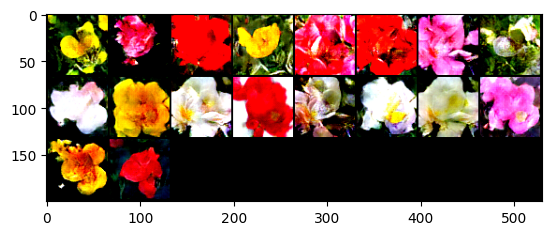

100%|██████████| 103/103 [00:24<00:00,  4.21it/s]


epoch: 1, lossD:0.4625090350514477, lossG:6.445984770950762,lossG_fake:3.2328690087910994, lossG_real:3.213115736697484 ,equality:0.019753272093615326


evaluate:130.59690856933594,kid_mean:0.08804237097501755, kid_std:0.040224891155958176,kid_:(tensor(0.0880), tensor(0.0402))


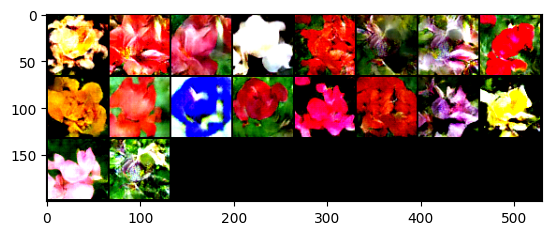

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 2, lossD:0.4027964880382552, lossG:6.29022126521879,lossG_fake:3.1189379379587265, lossG_real:3.171283331889551 ,equality:-0.05234539393082427


evaluate:130.94964599609375,kid_mean:0.08757612109184265, kid_std:0.045973315834999084,kid_:(tensor(0.0876), tensor(0.0460))


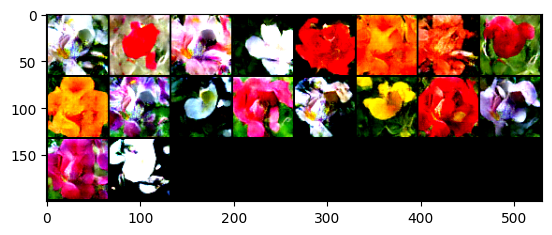

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 3, lossD:0.30586611007530135, lossG:6.434301723554296,lossG_fake:3.2244196505222504, lossG_real:3.2098820880778787 ,equality:0.014537562444371765


evaluate:130.27749633789062,kid_mean:0.0967048853635788, kid_std:0.042442552745342255,kid_:(tensor(0.0967), tensor(0.0424))


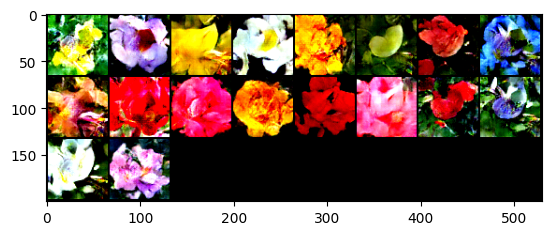

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 4, lossD:0.3799592745173903, lossG:6.463352444102463,lossG_fake:3.215262281518538, lossG_real:3.248090147393421 ,equality:-0.032827865874883067


evaluate:130.37222290039062,kid_mean:0.09032760560512543, kid_std:0.04922132566571236,kid_:(tensor(0.0903), tensor(0.0492))


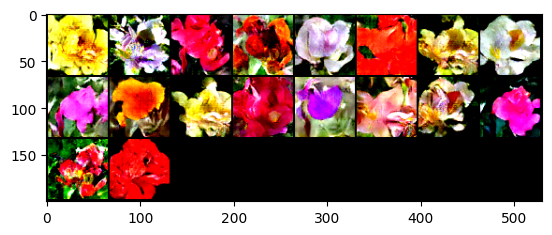

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 5, lossD:0.36585952073914335, lossG:6.36047711881619,lossG_fake:3.1653032621133677, lossG_real:3.1951738543880794 ,equality:-0.029870592274711782


evaluate:130.22628784179688,kid_mean:0.08709227293729782, kid_std:0.04014509543776512,kid_:(tensor(0.0871), tensor(0.0401))


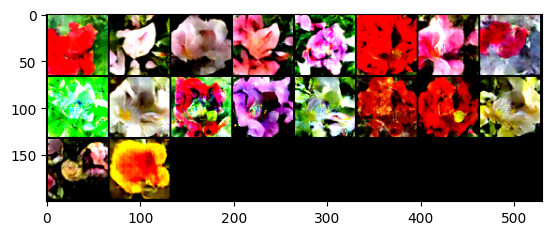

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 6, lossD:0.40097261907406223, lossG:6.516242786518578,lossG_fake:3.2463152310223253, lossG_real:3.2699275647552266 ,equality:-0.02361233373290128


evaluate:129.75355529785156,kid_mean:0.08788664638996124, kid_std:0.04467896744608879,kid_:(tensor(0.0879), tensor(0.0447))


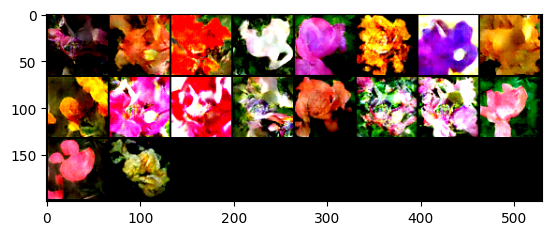

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 7, lossD:0.3513307038115934, lossG:6.535015490448591,lossG_fake:3.2689106013011004, lossG_real:3.2661048897261757 ,equality:0.0028057115749247075


evaluate:128.71229553222656,kid_mean:0.08932335674762726, kid_std:0.040941108018159866,kid_:(tensor(0.0893), tensor(0.0409))


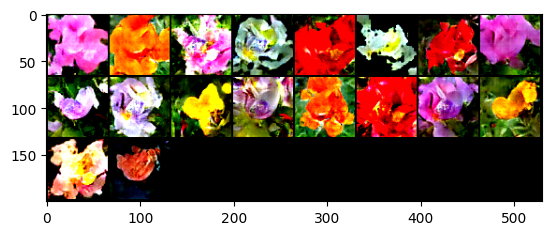

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 8, lossD:0.30070471468842724, lossG:6.629407109566105,lossG_fake:3.3187943488648792, lossG_real:3.3106127213505867 ,equality:0.008181627514292522


evaluate:128.9063262939453,kid_mean:0.10475639253854752, kid_std:0.05091690644621849,kid_:(tensor(0.1048), tensor(0.0509))


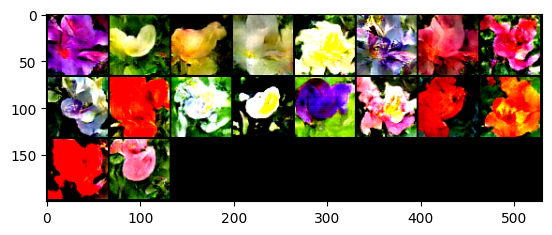

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 9, lossD:0.31978091906792333, lossG:6.765850562493778,lossG_fake:3.3982491921452644, lossG_real:3.367601372663257 ,equality:0.030647819482007232


evaluate:129.37953186035156,kid_mean:0.09036818146705627, kid_std:0.04580450803041458,kid_:(tensor(0.0904), tensor(0.0458))


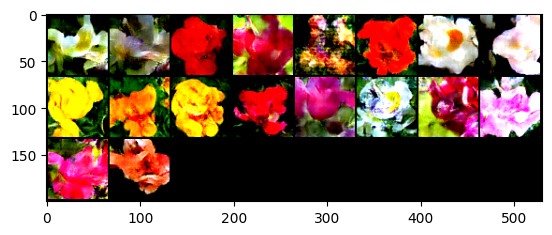

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 10, lossD:0.3431233151553615, lossG:6.697362626640542,lossG_fake:3.352234251001506, lossG_real:3.345128380557866 ,equality:0.007105870443639972


evaluate:129.35487365722656,kid_mean:0.09540499001741409, kid_std:0.04010285809636116,kid_:(tensor(0.0954), tensor(0.0401))


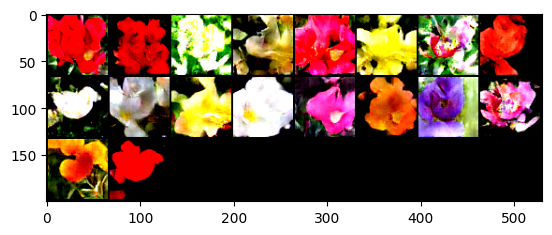

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 11, lossD:0.35588908897152227, lossG:6.876516971773314,lossG_fake:3.449294894065672, lossG_real:3.4272220499307204 ,equality:0.022072844134951364


evaluate:129.12548828125,kid_mean:0.08394977450370789, kid_std:0.04378829896450043,kid_:(tensor(0.0839), tensor(0.0438))


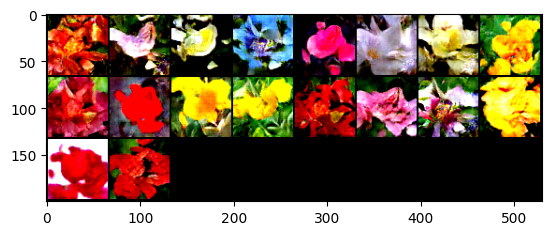

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 12, lossD:0.350994750640346, lossG:6.6458388671134285,lossG_fake:3.332697959779536, lossG_real:3.313140964045108 ,equality:0.01955699573442793


evaluate:128.8605194091797,kid_mean:0.08902069926261902, kid_std:0.03862393647432327,kid_:(tensor(0.0890), tensor(0.0386))


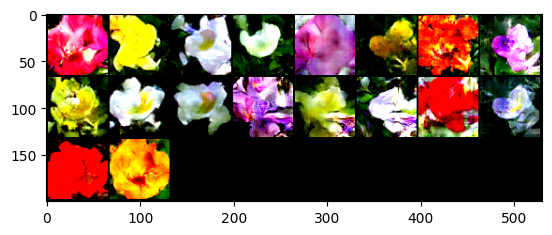

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 13, lossD:0.29379779033507536, lossG:6.918029424056266,lossG_fake:3.4661764091658362, lossG_real:3.451853006788828 ,equality:0.014323402377008243


evaluate:128.0227508544922,kid_mean:0.09157610684633255, kid_std:0.04612535983324051,kid_:(tensor(0.0916), tensor(0.0461))


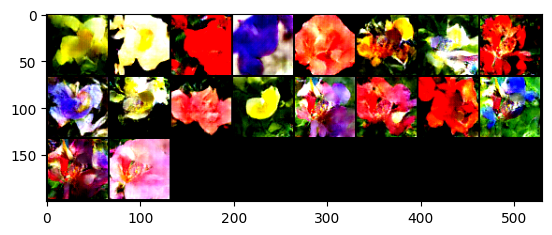

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 14, lossD:0.33547353579038847, lossG:6.972132442066971,lossG_fake:3.472991654595125, lossG_real:3.4991407556441225 ,equality:-0.02614910104899737


evaluate:127.298828125,kid_mean:0.08831345289945602, kid_std:0.042441871017217636,kid_:(tensor(0.0883), tensor(0.0424))


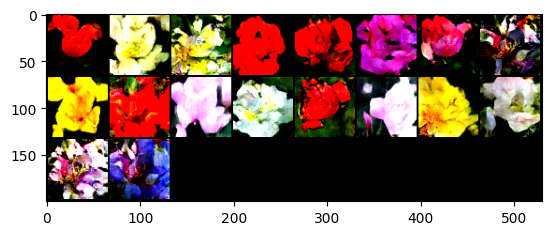

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 15, lossD:0.26307948038560675, lossG:6.791036221587542,lossG_fake:3.4301286206662076, lossG_real:3.3609076009213346 ,equality:0.06922101974487305


evaluate:128.0893096923828,kid_mean:0.09203464537858963, kid_std:0.04903358966112137,kid_:(tensor(0.0920), tensor(0.0490))


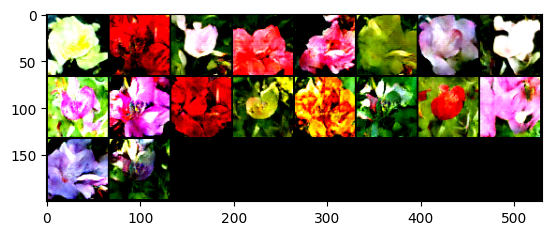

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 16, lossD:0.36696943619008204, lossG:6.936335165523788,lossG_fake:3.5196011448369444, lossG_real:3.416734030669175 ,equality:0.10286711416776928


evaluate:127.93844604492188,kid_mean:0.08978906273841858, kid_std:0.042625121772289276,kid_:(tensor(0.0898), tensor(0.0426))


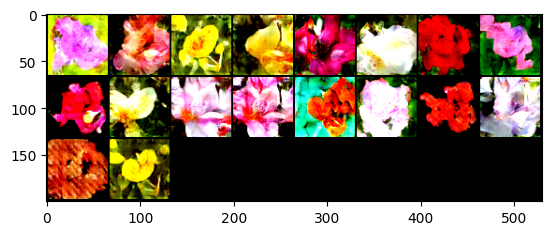

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 17, lossD:0.2904271883076256, lossG:6.880868939520086,lossG_fake:3.526032178147325, lossG_real:3.3548367920431117 ,equality:0.17119538610421348


evaluate:127.37789154052734,kid_mean:0.08540970832109451, kid_std:0.04907078295946121,kid_:(tensor(0.0854), tensor(0.0491))


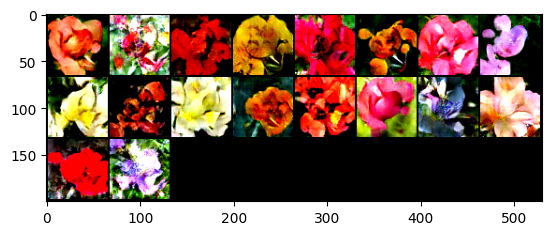

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 18, lossD:0.3203548264771121, lossG:6.859081939586158,lossG_fake:3.396504060880652, lossG_real:3.462577886373094 ,equality:-0.06607382549244223


evaluate:127.43563079833984,kid_mean:0.0853017047047615, kid_std:0.04475579783320427,kid_:(tensor(0.0853), tensor(0.0448))


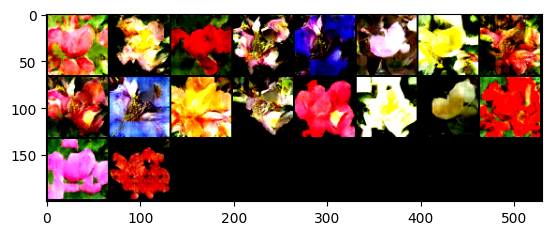

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 19, lossD:0.2852470914571031, lossG:6.900875110070682,lossG_fake:3.5009841270817135, lossG_real:3.399890994562686 ,equality:0.1010931325190274


evaluate:127.01937866210938,kid_mean:0.08983880281448364, kid_std:0.046641334891319275,kid_:(tensor(0.0898), tensor(0.0466))


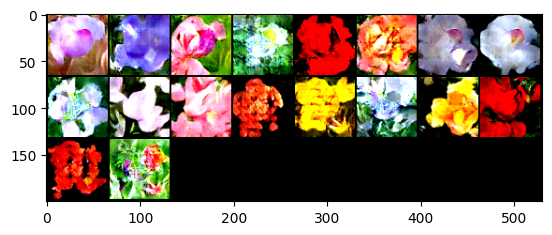

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 20, lossD:0.3254059152225557, lossG:6.761559736381456,lossG_fake:3.3822668699674234, lossG_real:3.379292882761909 ,equality:0.002973987205514561


evaluate:126.93136596679688,kid_mean:0.08578436076641083, kid_std:0.040863268077373505,kid_:(tensor(0.0858), tensor(0.0409))


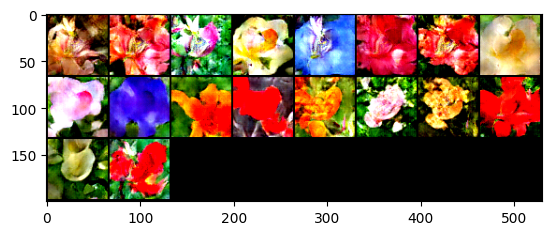

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 21, lossD:0.29853943802271654, lossG:6.823756491096274,lossG_fake:3.4325893214605387, lossG_real:3.391167208986375 ,equality:0.04142211247416361


evaluate:127.37002563476562,kid_mean:0.08720257133245468, kid_std:0.04370729625225067,kid_:(tensor(0.0872), tensor(0.0437))


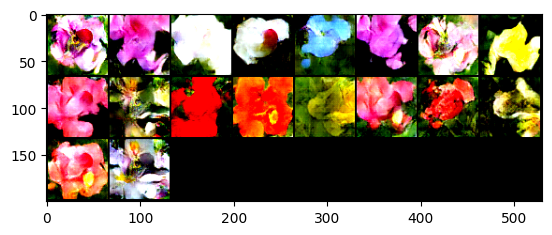

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 22, lossD:0.32490458787934295, lossG:7.109933635563526,lossG_fake:3.547048785732788, lossG_real:3.562884857064312 ,equality:-0.015836071331523982


evaluate:127.0707015991211,kid_mean:0.08599019050598145, kid_std:0.04716586694121361,kid_:(tensor(0.0860), tensor(0.0472))


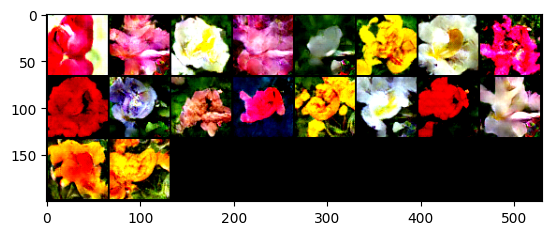

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 23, lossD:0.3172172045027747, lossG:6.956997871398926,lossG_fake:3.49721835249836, lossG_real:3.4597795073268482 ,equality:0.03743884517151175


evaluate:126.79778289794922,kid_mean:0.08511026203632355, kid_std:0.03563263267278671,kid_:(tensor(0.0851), tensor(0.0356))


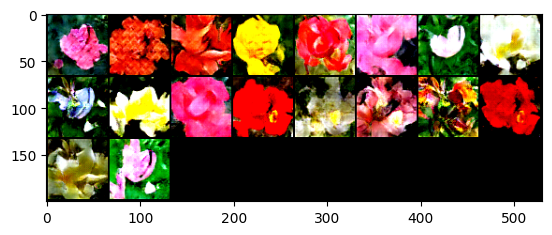

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 24, lossD:0.2803067754664757, lossG:6.9695700210275,lossG_fake:3.589920988360655, lossG_real:3.3796490477850134 ,equality:0.21027194057564147


evaluate:127.43403625488281,kid_mean:0.08790859580039978, kid_std:0.05040188878774643,kid_:(tensor(0.0879), tensor(0.0504))


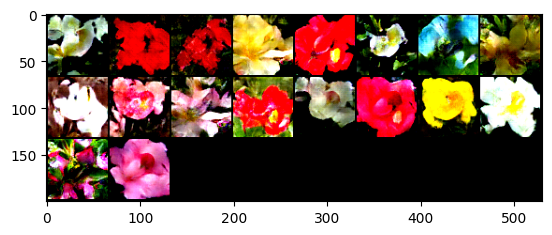

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 25, lossD:0.27650918662367224, lossG:7.06244350637047,lossG_fake:3.5452363282731434, lossG_real:3.5172071919857877 ,equality:0.028029136287355705


evaluate:127.4536361694336,kid_mean:0.08224742114543915, kid_std:0.03709164634346962,kid_:(tensor(0.0822), tensor(0.0371))


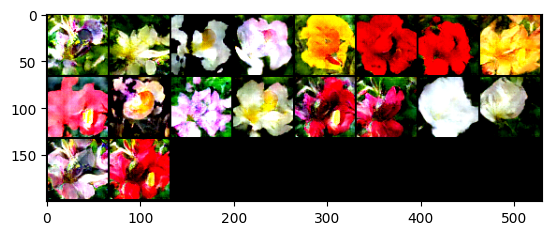

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 26, lossD:0.27765267364933943, lossG:7.091098169678623,lossG_fake:3.4934945106506348, lossG_real:3.5976036578706165 ,equality:-0.10410914721998177


evaluate:127.01618957519531,kid_mean:0.0941455289721489, kid_std:0.048516519367694855,kid_:(tensor(0.0941), tensor(0.0485))


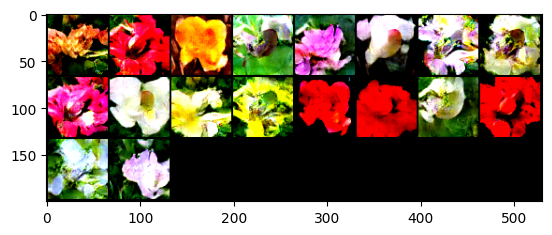

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 27, lossD:0.27008837011181613, lossG:7.0507995179555945,lossG_fake:3.5859862918992644, lossG_real:3.464813231843189 ,equality:0.12117306005607542


evaluate:127.23880767822266,kid_mean:0.08193471282720566, kid_std:0.04077707976102829,kid_:(tensor(0.0819), tensor(0.0408))


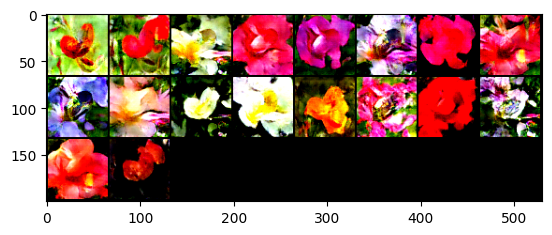

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 28, lossD:0.27933209859630437, lossG:6.940471158444303,lossG_fake:3.512631348035868, lossG_real:3.4278398023068326 ,equality:0.08479154572903536


evaluate:126.59980010986328,kid_mean:0.08146188408136368, kid_std:0.04700177162885666,kid_:(tensor(0.0815), tensor(0.0470))


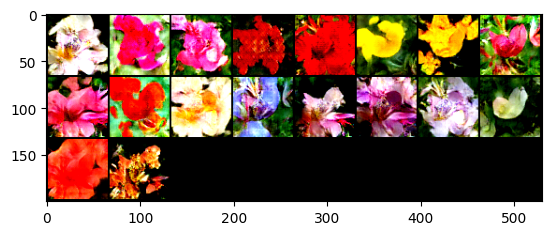

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 29, lossD:0.26340393700356624, lossG:7.157111945661526,lossG_fake:3.5206610421532565, lossG_real:3.6364509098738145 ,equality:-0.11578986772055799


evaluate:126.26132202148438,kid_mean:0.08102388679981232, kid_std:0.04601103812456131,kid_:(tensor(0.0810), tensor(0.0460))


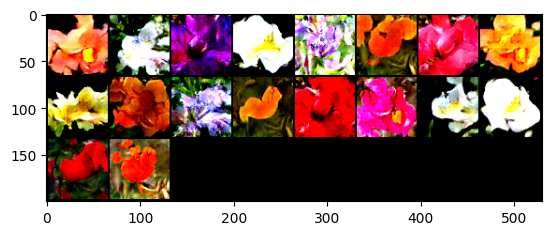

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 30, lossD:0.24507865322374026, lossG:7.217221973011795,lossG_fake:3.678408055629545, lossG_real:3.5388139220117365 ,equality:0.1395941336178086


evaluate:125.37368774414062,kid_mean:0.08025367558002472, kid_std:0.035891029983758926,kid_:(tensor(0.0803), tensor(0.0359))


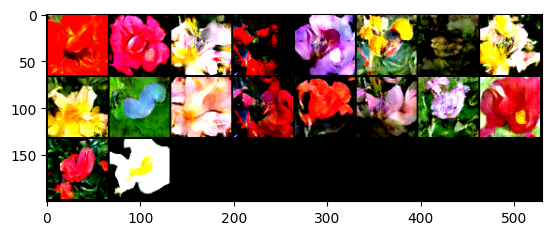

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 31, lossD:0.20459600788477844, lossG:6.8702729049238185,lossG_fake:3.4655284696412316, lossG_real:3.404744428193685 ,equality:0.06078404144754668


evaluate:125.54542541503906,kid_mean:0.08547987788915634, kid_std:0.041052959859371185,kid_:(tensor(0.0855), tensor(0.0411))


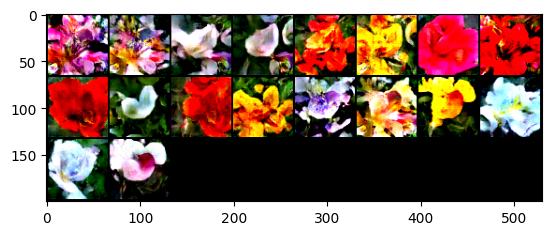

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 32, lossD:0.23574100229527475, lossG:7.216037324331339,lossG_fake:3.5408956391140096, lossG_real:3.6751417291974557 ,equality:-0.13424609008344612


evaluate:125.27418518066406,kid_mean:0.08987574279308319, kid_std:0.04069799557328224,kid_:(tensor(0.0899), tensor(0.0407))


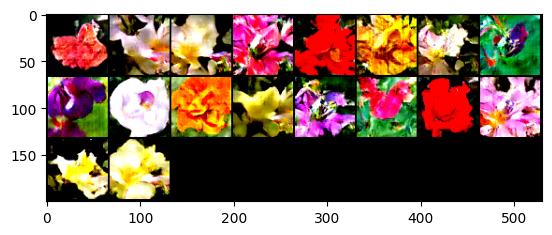

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 33, lossD:0.21469879046408008, lossG:7.1259645628697665,lossG_fake:3.554986224591153, lossG_real:3.5709783324917543 ,equality:-0.015992107900601127


evaluate:125.4917221069336,kid_mean:0.08132017403841019, kid_std:0.04038919880986214,kid_:(tensor(0.0813), tensor(0.0404))


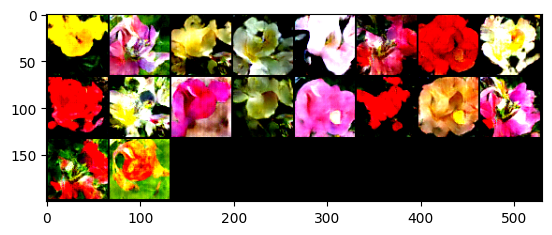

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 34, lossD:0.2690080299666061, lossG:7.34907155823939,lossG_fake:3.7672028391106616, lossG_real:3.581868737067991 ,equality:0.18533410204267042


evaluate:125.26066589355469,kid_mean:0.08662858605384827, kid_std:0.044174741953611374,kid_:(tensor(0.0866), tensor(0.0442))


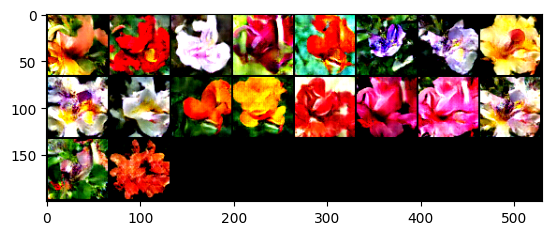

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 35, lossD:0.20590651773133326, lossG:6.955621409184724,lossG_fake:3.498768588871632, lossG_real:3.456852821470464 ,equality:0.04191576740116787


evaluate:125.31856536865234,kid_mean:0.08829927444458008, kid_std:0.0498998761177063,kid_:(tensor(0.0883), tensor(0.0499))


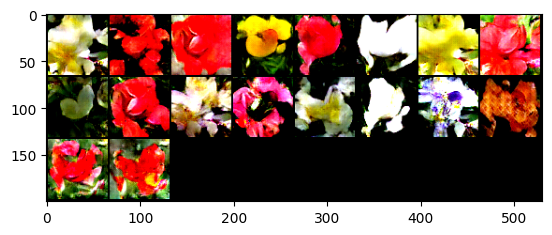

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 36, lossD:0.26818355186435494, lossG:7.323337045688073,lossG_fake:3.6406226678959372, lossG_real:3.6827144148280317 ,equality:-0.0420917469320945
evaluate:125.11135864257812,kid_mean:0.08680295199155807, kid_std:0.04641494154930115,kid_:(tensor(0.0868), tensor(0.0464))


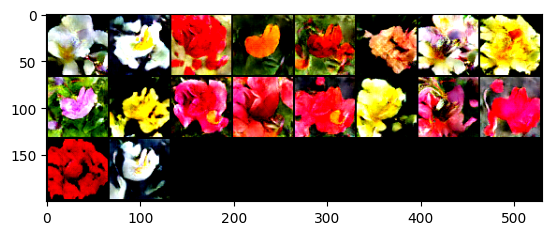

100%|██████████| 103/103 [00:24<00:00,  4.21it/s]


epoch: 37, lossD:0.2207398795097777, lossG:7.477031309627792,lossG_fake:3.7535999041159176, lossG_real:3.7234314225831078 ,equality:0.03016848153280982


evaluate:125.10572814941406,kid_mean:0.0850135013461113, kid_std:0.05350415036082268,kid_:(tensor(0.0850), tensor(0.0535))


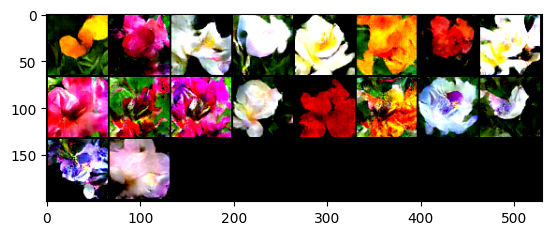

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 38, lossD:0.19310046798432046, lossG:7.121351292989786,lossG_fake:3.592836757308071, lossG_real:3.528514524686684 ,equality:0.06432223262138725


evaluate:125.44432830810547,kid_mean:0.08570563048124313, kid_std:0.04404814541339874,kid_:(tensor(0.0857), tensor(0.0440))


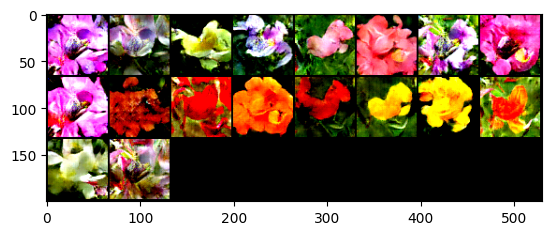

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 39, lossD:0.22732647665713018, lossG:7.174025827241175,lossG_fake:3.6224648263847943, lossG_real:3.551560978287632 ,equality:0.07090384809716221


evaluate:124.91030883789062,kid_mean:0.09760772436857224, kid_std:0.05054565519094467,kid_:(tensor(0.0976), tensor(0.0505))


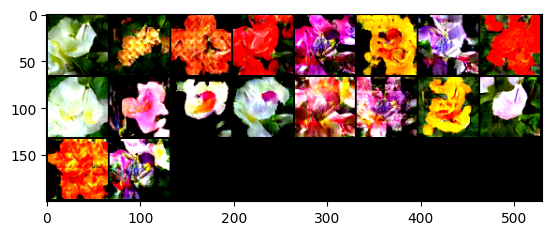

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 40, lossD:0.2395005193222495, lossG:7.085011315577239,lossG_fake:3.545375005423444, lossG_real:3.5396363197021112 ,equality:0.005738685721332626


evaluate:124.85980987548828,kid_mean:0.08003544062376022, kid_std:0.046239130198955536,kid_:(tensor(0.0800), tensor(0.0462))


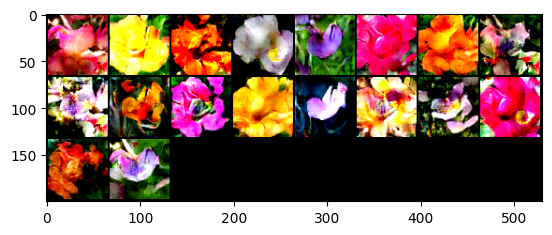

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 41, lossD:0.203905459674238, lossG:7.314632138002266,lossG_fake:3.7280513742595045, lossG_real:3.5865807458034995 ,equality:0.141470628456005


evaluate:124.97367095947266,kid_mean:0.08240335434675217, kid_std:0.042569033801555634,kid_:(tensor(0.0824), tensor(0.0426))


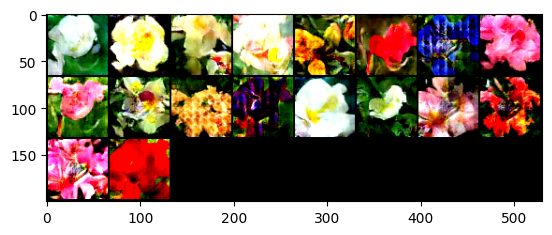

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 42, lossD:0.2385215834009199, lossG:7.49278752780655,lossG_fake:3.7346781688986472, lossG_real:3.75810932997361 ,equality:-0.02343116107496268


evaluate:124.99983215332031,kid_mean:0.08390151709318161, kid_std:0.04704781621694565,kid_:(tensor(0.0839), tensor(0.0470))


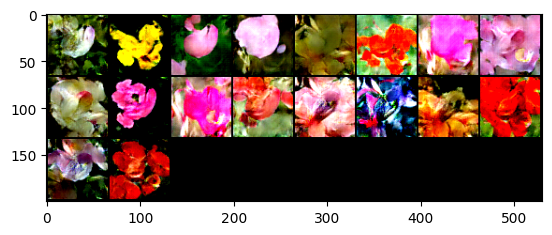

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 43, lossD:0.2603296638168033, lossG:7.275905905418026,lossG_fake:3.6786190369754164, lossG_real:3.597286852818091 ,equality:0.08133218415732557


evaluate:125.47408294677734,kid_mean:0.08172760158777237, kid_std:0.03957550972700119,kid_:(tensor(0.0817), tensor(0.0396))


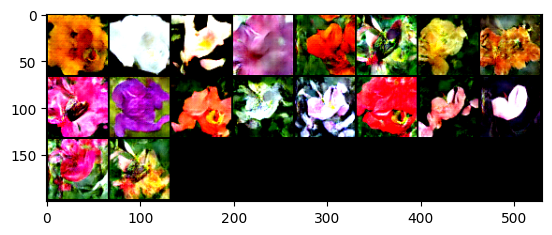

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 44, lossD:0.17772536829692645, lossG:7.289519555360368,lossG_fake:3.7106540272536788, lossG_real:3.578865521162459 ,equality:0.13178850609121984


evaluate:125.04414367675781,kid_mean:0.08179078996181488, kid_std:0.04640357941389084,kid_:(tensor(0.0818), tensor(0.0464))


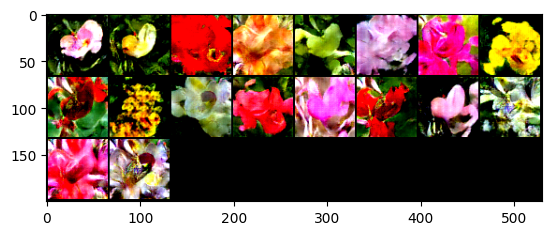

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 45, lossD:0.22039825490956166, lossG:7.362822162294851,lossG_fake:3.689622135706318, lossG_real:3.6732000228270745 ,equality:0.016422112879243667


evaluate:124.6597671508789,kid_mean:0.08235985040664673, kid_std:0.0396946482360363,kid_:(tensor(0.0824), tensor(0.0397))


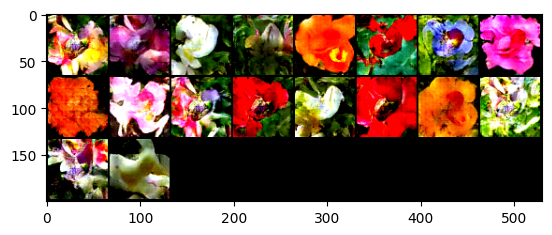

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 46, lossD:0.24403980852656285, lossG:7.297092738660794,lossG_fake:3.561419309342949, lossG_real:3.7356734258457296 ,equality:-0.17425411650278066


evaluate:125.33757781982422,kid_mean:0.0873856246471405, kid_std:0.05018147826194763,kid_:(tensor(0.0874), tensor(0.0502))


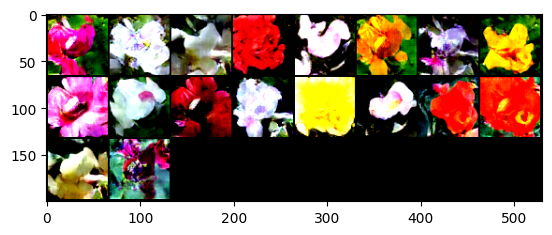

100%|██████████| 103/103 [00:24<00:00,  4.20it/s]


epoch: 47, lossD:0.23649110203807794, lossG:7.697126332995961,lossG_fake:3.856511319725259, lossG_real:3.8406149716053193 ,equality:0.015896348119939674


evaluate:124.77781677246094,kid_mean:0.08827852457761765, kid_std:0.05096670240163803,kid_:(tensor(0.0883), tensor(0.0510))


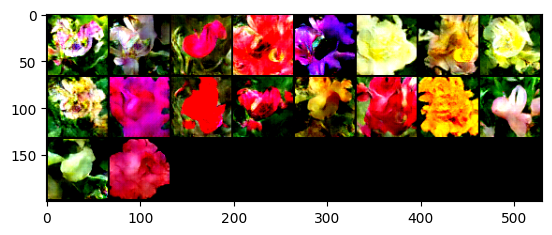

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 48, lossD:0.23562549507625183, lossG:7.683986224017097,lossG_fake:3.90330123091207, lossG_real:3.780685016252462 ,equality:0.1226162146596077


evaluate:124.69486999511719,kid_mean:0.08239736407995224, kid_std:0.040790192782878876,kid_:(tensor(0.0824), tensor(0.0408))


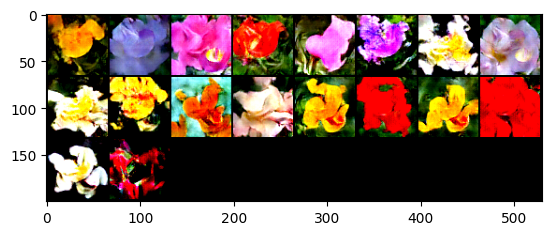

100%|██████████| 103/103 [00:24<00:00,  4.19it/s]


epoch: 49, lossD:0.17882557385103795, lossG:7.195161972231078,lossG_fake:3.6181355980993475, lossG_real:3.5770263683448715 ,equality:0.04110922975447595


evaluate:124.77830505371094,kid_mean:0.09282173961400986, kid_std:0.045401208102703094,kid_:(tensor(0.0928), tensor(0.0454))


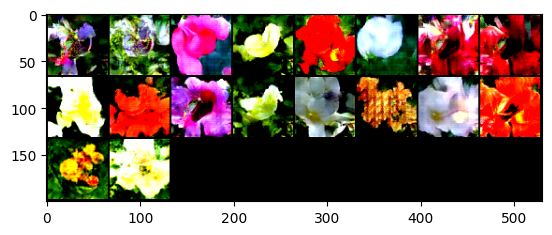

In [55]:
lossesD = []
lossesG = []

raw_lossesD = []
raw_lossesG = []
lossesG_fake = []
lossesG_real = []

equality = 0.0
sum_equality = 0.0
d_equality = []

relu = torch.nn.ReLU()

fid_ = []
kid_mean_ = []
kid_std_ = []
kid_score = []
for epoch in range(opt.n_epoch):
    running_lossD = 0.0 #損失関数初期化
    running_lossG = 0.0
    lossG_fake_running = 0.0
    lossG_real_running = 0.0

    #sum_equality += equality
    equality = 0.0
   # for i , (real_imgs, _) in enumerate(tqdm.tqdm(dataloader, position = 0)):#celebA
    for i , real_imgs in enumerate(tqdm.tqdm(dataloader, position = 0)):#flower
        real_imgs = real_imgs.to(device)
        batch_size = real_imgs.size()[0]
        noise = torch.randn(batch_size, opt.z_dim, 1, 1).to(device)

        #train discriminator

        netD.zero_grad()
        output_real = netD(real_imgs)

        #lossD_real = criterion(output, labels_real)
        lossD_real = torch.mean(relu(1.0 - output_real))


        fake_imgs = netG(noise)##not train  output_fake_d
        output_fake_d = netD(fake_imgs.detach())#not train  output_fake_d

        #lossD_fake = criterion(output, labels_fake)
        lossD_fake = torch.mean(relu(1.0 + output_fake_d))


        lossD = lossD_real + lossD_fake
        #lossD = torch.mean(torch.log(torch.sigmoid(output_real)))- torch.mean(torch.log(torch.sigmoid(output_fake_d)))  #not train  output_fake_d
        lossD.backward()
        optimizerD.step()

        #train generator

        netG.zero_grad()#勾配初期

        output_fake_g = netD(fake_imgs)#train  output_fake_g
        output_real = netD(real_imgs)

        lossG_fake = torch.mean(relu(1.0 - output_fake_g))
        lossG_real = torch.mean(relu(1.0 + output_real))
        #lossG =  torch.mean(torch.log(torch.sigmoid(output_fake_g - output_real))) #- torch.mean(torch.log(torch.sigmoid(output_real)))#train  output_fake_g
        lossG =    lossG_real + lossG_fake


        lossG.backward()
        optimizerG.step()

        # save loss

        running_lossD += lossD.item()
        running_lossG += lossG.item()

        raw_lossesD.append(lossD.item())
        raw_lossesG.append(lossG.item())

        lossG_fake_running += lossG_fake.item()
        lossG_real_running += lossG_real.item()



    running_lossD /=len(dataloader)
    running_lossG /=len(dataloader)

    lossG_fake_running /= len(dataloader)
    lossG_real_running /= len(dataloader)
#equality
    equality = ( lossG_fake_running - lossG_real_running  )
    d_equality.append(equality)


    print("epoch: {}, lossD:{}, lossG:{},lossG_fake:{}, lossG_real:{} ,equality:{}".format(epoch, running_lossD, running_lossG,lossG_fake_running,lossG_real_running,equality))#-->,lossG_fake:{}, lossG_real:{},lossG_fake_running,lossG_real_running
    lossesD.append(running_lossD)
    lossesG.append(running_lossG)

    lossesG_fake.append(lossG_fake_running)
    lossesG_real.append(lossG_real_running)

     #evaluate GAN
    fake_imgs_1 = fake_imgs.detach()
    real_imgs_1 = real_imgs.to(dtype=torch.uint8).cpu()
    fake_imgs_1 = fake_imgs_1.to(dtype=torch.uint8).cpu()
    fid.update(real_imgs_1, real=True)
    fid.update(fake_imgs_1, real=False)
    eval = fid.compute()

    kid.update(real_imgs_1, real=True)
    kid.update(fake_imgs_1, real=False)
    kid_ = kid.compute()
    kid_mean, kid_std = kid.compute()



    print("evaluate:{},kid_mean:{}, kid_std:{},kid_:{}".format(eval, kid_mean, kid_std, kid_))
    fid_.append(eval)
    kid_mean_.append(kid_mean)
    kid_std_.append(kid_std)
    kid_score.append(kid_)
    #show fake image
    grid_imgs = vutils.make_grid(fake_imgs[:24].detach()+0.5)
    grid_imgs_arr = grid_imgs.cpu().numpy()
    plt.imshow(np.transpose(grid_imgs_arr, (1,2,0)))
    plt.show()

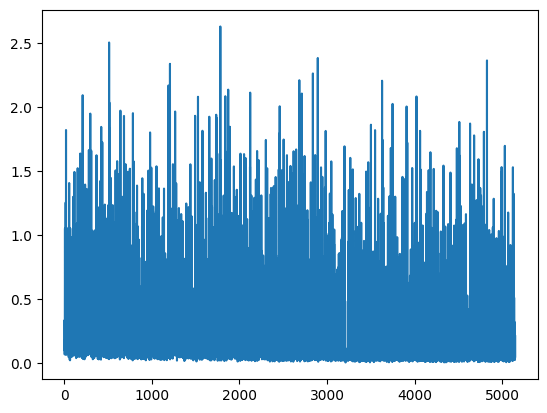

In [56]:
plt.plot(raw_lossesD)

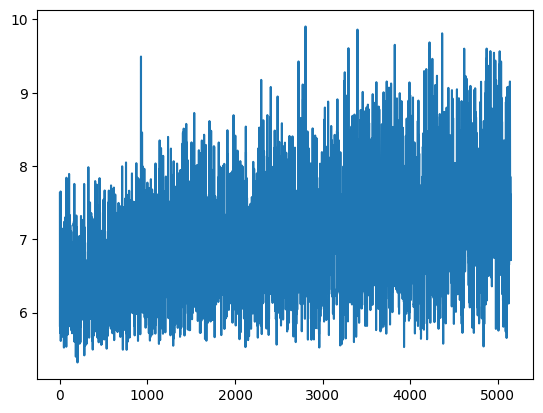

In [57]:
plt.plot(raw_lossesG)

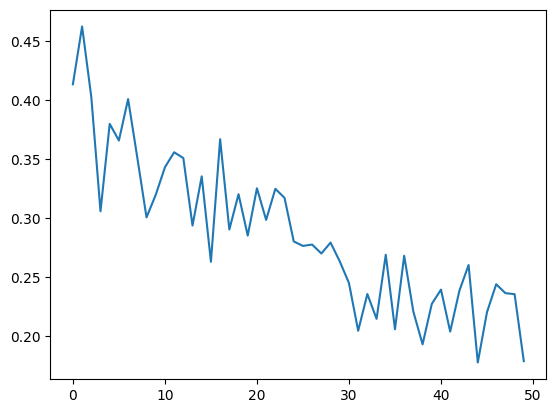

In [58]:
plt.plot(lossesD)

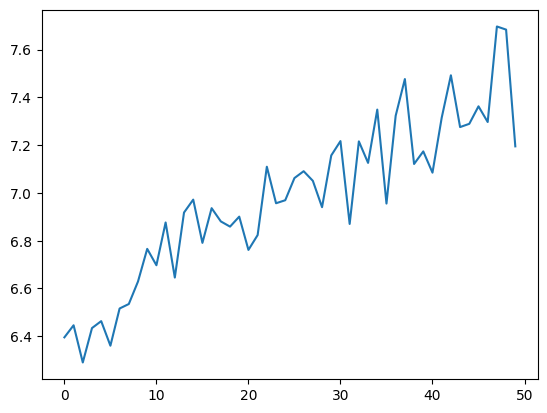

In [59]:
plt.plot(lossesG)

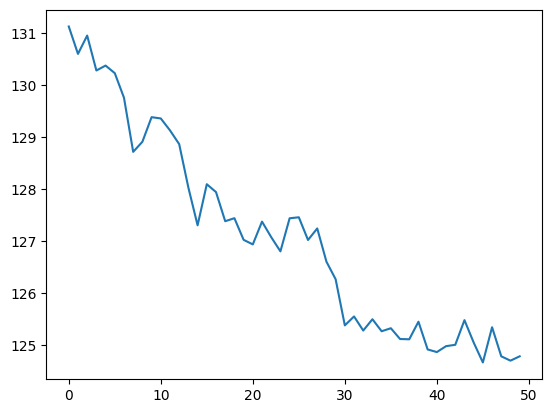

In [60]:
plt.plot(fid_)

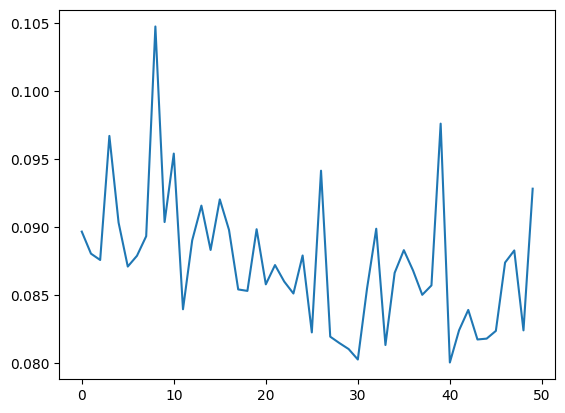

In [61]:
plt.plot(kid_mean_)

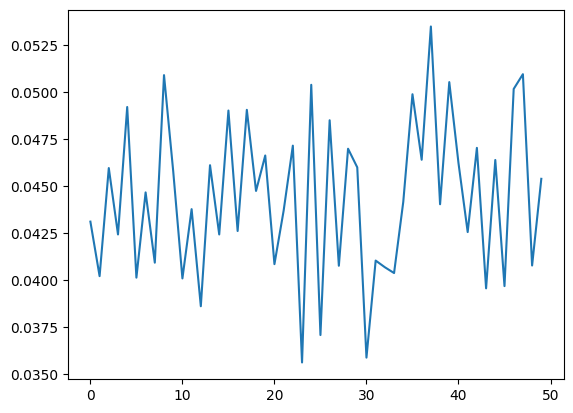

In [62]:
plt.plot(kid_std_)

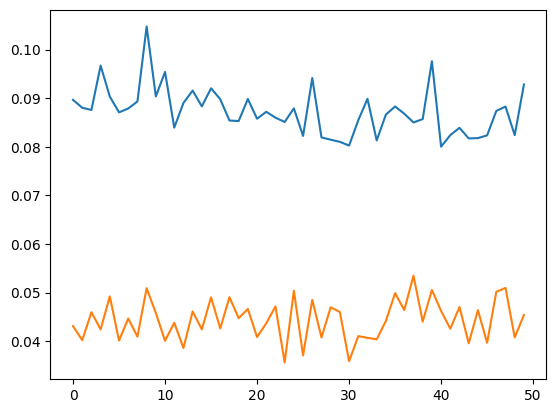

In [63]:
plt.plot(kid_score)

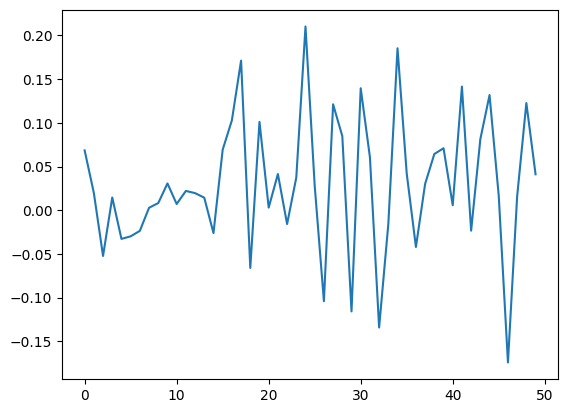

In [64]:
plt.plot(d_equality)

In [65]:

real_imgs = real_imgs.to(dtype=torch.uint8).cpu()
fake_imgs = fake_imgs.to(dtype=torch.uint8).cpu()
fid.update(real_imgs, real=True)
fid.update(fake_imgs, real=False)
fid.compute()

kid.update(real_imgs, real=True)
kid.update(fake_imgs, real=False)
kid.compute()

(tensor(0.0894), tensor(0.0405))